# U-Net for Semantic Segmentation
In this notebook, we implement a U-Net architecture to perform semantic segmentation. We first build and train a baseline model to understand the standard architecture. Then, we perform an ablation study by reducing the number of channels and progressively removing skip connections to evaluate how these changes affect the quality of the reconstructed segmentation masks.

## Import Libraries
Import PyTorch, NumPy, and Matplotlib to build the network and visualize results.

In [1]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms, utils
from torchvision.io import read_file, decode_jpeg, decode_png, ImageReadMode
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torchvision.io import read_image
import os

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Dataset Setup
Define the custom class to load and preprocess images and segmentation masks.

In [2]:
# DATASET
import os

# read dataset for u-net
class Dataset(Dataset):
    def __init__(self, data_dir, label_dir):
        self.data_dir = data_dir
        self.label_dir = label_dir
        self.files = [os.path.splitext(f)[0] for f in os.listdir(data_dir)]
        self.transform = T.Resize((512, 512))

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        file_name = self.files[idx]
        # read image
        image = read_image(os.path.join(self.data_dir, file_name + ".png"), mode=ImageReadMode.RGB)
        
        # read mask
        mask = read_image(os.path.join(self.label_dir, file_name + ".png"), mode=ImageReadMode.GRAY)
        
        # resize
        image = self.transform(image)
        mask = self.transform(mask)
        
        image = torch.tensor(image, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.float32)
        
        image = image / 255.0
        mask /= 255.0
        mask = torch.round(mask)

        return image, mask
        

        
ds = Dataset("./data/Synthetic/test", "./data/Synthetic/labels")
ds_loader = DataLoader(ds, batch_size=4)

## U-Net Components
Construct the basic building blocks: Convolutional, Encoder, and Decoder modules.

In [3]:
import torch
import torch.nn as nn

""" Convolutional block:
    It follows a two 3x3 convolutional layer, each followed by a batch normalization and a relu activation.
"""
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

""" Encoder block:
    It consists of an conv_block followed by a max pooling.
    Here the number of filters doubles and the height and width half after every block.
"""
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

""" Decoder block:
    The decoder block begins with a transpose convolution, followed by a concatenation with the skip
    connection from the encoder block. Next comes the conv_block.
    Here the number filters decreases by half and the height and width doubles.
"""
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c, has_skip=True):
        super().__init__()
        self.has_skip = has_skip
        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        conv_in = out_c + out_c if has_skip else out_c
        self.conv = conv_block(conv_in, out_c)

    def forward(self, x, skip=None):
        x = self.up(x)
        if self.has_skip and skip is not None:
            x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x
    

## U-Net Model Architecture
Assemble the complete model, designed to support flexible channel sizes and optional skip connections.

In [4]:
class build_unet(nn.Module):
    def __init__(self, channels=[64, 128, 256, 512], bottleneck=1024, skips=[True, True, True, True]):
        super().__init__()
        
        self.e1 = encoder_block(3, channels[0])
        self.e2 = encoder_block(channels[0], channels[1])
        self.e3 = encoder_block(channels[1], channels[2])
        self.e4 = encoder_block(channels[2], channels[3])
        self.b = conv_block(channels[3], bottleneck)

        self.d1 = decoder_block(bottleneck, channels[3], skips[0])
        self.d2 = decoder_block(channels[3], channels[2], skips[1])
        self.d3 = decoder_block(channels[2], channels[1], skips[2])
        self.d4 = decoder_block(channels[1], channels[0], skips[3])

        self.outputs = nn.Conv2d(channels[0], 1, kernel_size=1, padding=0)

    def forward(self, inputs):
        # Encoder
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)
        
        # Bottleneck
        b = self.b(p4)
        
        # Decoder
        d1 = self.d1(b, s4) if self.d1.has_skip else self.d1(b)
        d2 = self.d2(d1, s3) if self.d2.has_skip else self.d2(d1)
        d3 = self.d3(d2, s2) if self.d3.has_skip else self.d3(d2)
        d4 = self.d4(d3, s1) if self.d4.has_skip else self.d4(d3)
        
        # Classifier
        outputs = self.outputs(d4)
        
        return outputs

    
inputs = torch.randn((2, 3, 512, 512)).to(device)

### Model 1: Original U-Net (Baseline)
In this section, we initialize and train the standard U-Net architecture. This model uses the full set of filters (64, 128, 256, 512) and all four skip connections. This serves as our performance benchmark to evaluate how well the network can segment images under ideal structural conditions.

Training Original model ...


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.2667
Batch: 0
Epoch [2/200], Loss: 0.6342
Batch: 0
Epoch [3/200], Loss: 0.1734
Batch: 0
Epoch [4/200], Loss: 0.1187
Batch: 0
Epoch [5/200], Loss: 0.0760
Batch: 0
Epoch [6/200], Loss: 0.0602
Batch: 0
Epoch [7/200], Loss: 0.0465
Batch: 0
Epoch [8/200], Loss: 0.0400
Batch: 0
Epoch [9/200], Loss: 0.0306
Batch: 0
Epoch [10/200], Loss: 0.0252
Batch: 0
Epoch [11/200], Loss: 0.0189
Batch: 0
Epoch [12/200], Loss: 0.0159
Batch: 0
Epoch [13/200], Loss: 0.0133
Batch: 0
Epoch [14/200], Loss: 0.0112
Batch: 0
Epoch [15/200], Loss: 0.0094
Batch: 0
Epoch [16/200], Loss: 0.0076
Batch: 0
Epoch [17/200], Loss: 0.0068
Batch: 0
Epoch [18/200], Loss: 0.0063
Batch: 0
Epoch [19/200], Loss: 0.0056
Batch: 0
Epoch [20/200], Loss: 0.0055
Batch: 0
Epoch [21/200], Loss: 0.0054
Batch: 0
Epoch [22/200], Loss: 0.0049
Batch: 0
Epoch [23/200], Loss: 0.0046
Batch: 0
Epoch [24/200], Loss: 0.0043
Batch: 0
Epoch [25/200], Loss: 0.0041
Batch: 0
Epoch [26/200], Loss: 0.0039
Batch: 0
Epoch [27/20

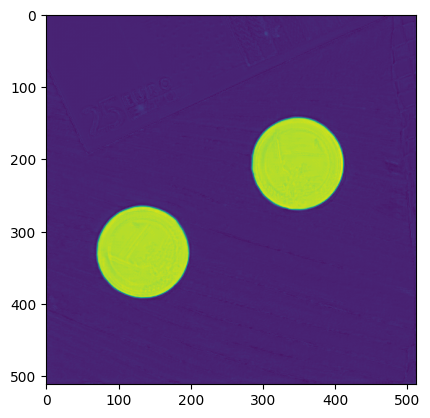

In [5]:
model_original = build_unet(channels=[64, 128, 256, 512], bottleneck=1024, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_original.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training Original model ...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_original(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_original.state_dict(), "model_original.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
    
    torch.cuda.empty_cache()

model_original.load_state_dict(torch.load("model_original.pth"))

it = iter(ds_loader)
img, label = next(it)

model_original.eval()

ret = model_original(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())


### Conclusions - Baseline Model:
 The original U-Net demonstrates high precision in boundary detection. The combination of deep feature extraction and full skip connections allows the model to reconstruct the spatial resolution effectively, producing masks that are very close to the ground truth.

# Experiment: Model Simplification
In this section, we reduce the number of channels in each layer. We want to observe if a lighter model with fewer parameters can still maintain a high level of accuracy.

### 2. Model 1/2: Half Channels
We reduce the initial number of filters by half (32, 64, 128, 256). This experiment tests if the model can maintain performance while reducing its memory footprint.

Training Simplified model (Channel/2)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.4926
Batch: 0
Epoch [2/200], Loss: 0.5054
Batch: 0
Epoch [3/200], Loss: 0.3291
Batch: 0
Epoch [4/200], Loss: 0.2699
Batch: 0
Epoch [5/200], Loss: 0.2269
Batch: 0
Epoch [6/200], Loss: 0.1853
Batch: 0
Epoch [7/200], Loss: 0.1469
Batch: 0
Epoch [8/200], Loss: 0.1162
Batch: 0
Epoch [9/200], Loss: 0.0917
Batch: 0
Epoch [10/200], Loss: 0.0706
Batch: 0
Epoch [11/200], Loss: 0.0562
Batch: 0
Epoch [12/200], Loss: 0.0426
Batch: 0
Epoch [13/200], Loss: 0.0343
Batch: 0
Epoch [14/200], Loss: 0.0263
Batch: 0
Epoch [15/200], Loss: 0.0203
Batch: 0
Epoch [16/200], Loss: 0.0158
Batch: 0
Epoch [17/200], Loss: 0.0124
Batch: 0
Epoch [18/200], Loss: 0.0103
Batch: 0
Epoch [19/200], Loss: 0.0086
Batch: 0
Epoch [20/200], Loss: 0.0071
Batch: 0
Epoch [21/200], Loss: 0.0063
Batch: 0
Epoch [22/200], Loss: 0.0058
Batch: 0
Epoch [23/200], Loss: 0.0055
Batch: 0
Epoch [24/200], Loss: 0.0053
Batch: 0
Epoch [25/200], Loss: 0.0051
Batch: 0
Epoch [26/200], Loss: 0.0050
Batch: 0
Epoch [27/20

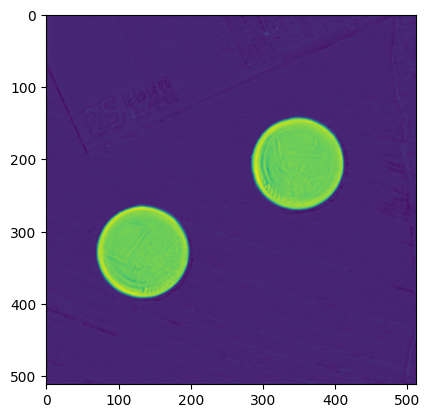

In [6]:
model_simplified = build_unet(channels=[32, 64, 128, 256], bottleneck=512, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_simplified.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training Simplified model (Channel/2)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_simplified(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_simplified.state_dict(), "model_simplified.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    torch.cuda.empty_cache()

model_simplified.load_state_dict(torch.load("model_simplified.pth"))


it = iter(ds_loader)
img, label = next(it)

model_simplified.eval()

ret = model_simplified(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - 1 / 2 channel Reduced Model
There is a negligible loss in accuracy, suggesting that the original model might be over-parameterized for this specific dataset.

### 3. Model 1/4: Quarter Channels
We continue the reduction to one-fourth of the original filters (16, 32, 64, 128). This version is significantly lighter and faster to train.

Training Simplified model (Channel/4)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.2755
Batch: 0
Epoch [2/200], Loss: 0.1735
Batch: 0
Epoch [3/200], Loss: 0.1463
Batch: 0
Epoch [4/200], Loss: 0.1261
Batch: 0
Epoch [5/200], Loss: 0.1061
Batch: 0
Epoch [6/200], Loss: 0.0920
Batch: 0
Epoch [7/200], Loss: 0.0815
Batch: 0
Epoch [8/200], Loss: 0.0709
Batch: 0
Epoch [9/200], Loss: 0.0606
Batch: 0
Epoch [10/200], Loss: 0.0514
Batch: 0
Epoch [11/200], Loss: 0.0427
Batch: 0
Epoch [12/200], Loss: 0.0348
Batch: 0
Epoch [13/200], Loss: 0.0276
Batch: 0
Epoch [14/200], Loss: 0.0236
Batch: 0
Epoch [15/200], Loss: 0.0198
Batch: 0
Epoch [16/200], Loss: 0.0152
Batch: 0
Epoch [17/200], Loss: 0.0134
Batch: 0
Epoch [18/200], Loss: 0.0122
Batch: 0
Epoch [19/200], Loss: 0.0105
Batch: 0
Epoch [20/200], Loss: 0.0091
Batch: 0
Epoch [21/200], Loss: 0.0082
Batch: 0
Epoch [22/200], Loss: 0.0073
Batch: 0
Epoch [23/200], Loss: 0.0068
Batch: 0
Epoch [24/200], Loss: 0.0063
Batch: 0
Epoch [25/200], Loss: 0.0059
Batch: 0
Epoch [26/200], Loss: 0.0056
Batch: 0
Epoch [27/20

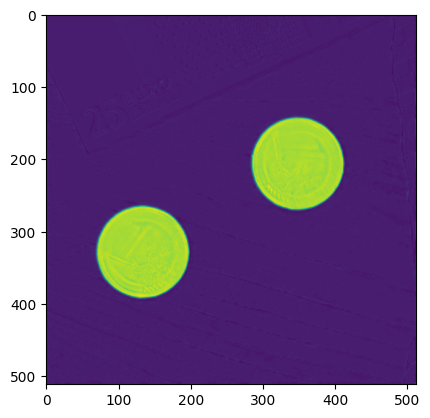

In [7]:
model_simplified_4 = build_unet(channels=[16, 32, 64, 128], bottleneck=256, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_simplified_4.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training Simplified model (Channel/4)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_simplified_4(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_simplified_4.state_dict(), "model_simplified_4.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    torch.cuda.empty_cache()
       
model_simplified_4.load_state_dict(torch.load("model_simplified_4.pth"))

it = iter(ds_loader)
img, label = next(it)

model_simplified_4.eval()

ret = model_simplified_4(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - 1/4 channel Reduced Model
The model still performs well, though some very fine details in the segmentation mask start to show minor smoothing compared to the baseline.

### 4. Model 1/8: One-Eighth Channels
The channel count is reduced to 1/8 of the original (8, 16, 32, 64). We are looking for the point where the network's learning capacity begins to degrade.

Training Simplified model (Channel/8)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.5014
Batch: 0
Epoch [2/200], Loss: 0.4042
Batch: 0
Epoch [3/200], Loss: 0.3492
Batch: 0
Epoch [4/200], Loss: 0.3042
Batch: 0
Epoch [5/200], Loss: 0.2691
Batch: 0
Epoch [6/200], Loss: 0.2400
Batch: 0
Epoch [7/200], Loss: 0.2124
Batch: 0
Epoch [8/200], Loss: 0.1900
Batch: 0
Epoch [9/200], Loss: 0.1706
Batch: 0
Epoch [10/200], Loss: 0.1530
Batch: 0
Epoch [11/200], Loss: 0.1371
Batch: 0
Epoch [12/200], Loss: 0.1191
Batch: 0
Epoch [13/200], Loss: 0.1065
Batch: 0
Epoch [14/200], Loss: 0.0897
Batch: 0
Epoch [15/200], Loss: 0.0773
Batch: 0
Epoch [16/200], Loss: 0.0646
Batch: 0
Epoch [17/200], Loss: 0.0561
Batch: 0
Epoch [18/200], Loss: 0.0478
Batch: 0
Epoch [19/200], Loss: 0.0408
Batch: 0
Epoch [20/200], Loss: 0.0356
Batch: 0
Epoch [21/200], Loss: 0.0309
Batch: 0
Epoch [22/200], Loss: 0.0279
Batch: 0
Epoch [23/200], Loss: 0.0246
Batch: 0
Epoch [24/200], Loss: 0.0224
Batch: 0
Epoch [25/200], Loss: 0.0201
Batch: 0
Epoch [26/200], Loss: 0.0185
Batch: 0
Epoch [27/20

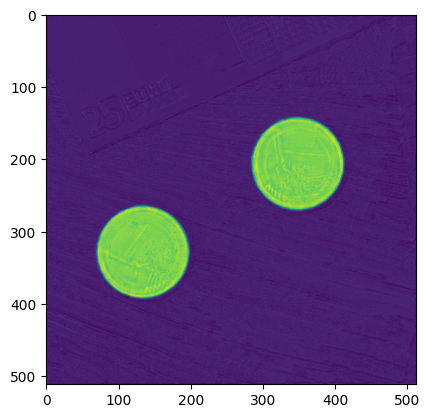

In [8]:
model_simplified_8 = build_unet(channels=[8, 16, 32, 64], bottleneck=128, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_simplified_8.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training Simplified model (Channel/8)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_simplified_8(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_simplified_8.state_dict(), "model_simplified_8.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
        
    torch.cuda.empty_cache()
    
model_simplified_8.load_state_dict(torch.load("model_simplified_8.pth"))

it = iter(ds_loader)
img, label = next(it)

model_simplified_8.eval()

ret = model_simplified_8(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - 1/8 channel Reduced Model
A drop in performance occurs. The lack of filters makes it harder for the model to distinguish between foreground and background in complex areas.

### 5. Model 1/16: One-Sixteenth Channels
In this extreme reduction (4, 8, 16, 32), we test the U-Net's limits. This model has very few parameters for feature extraction.

Training Simplified model (Channel/16)...
Batch: 0
Epoch [1/200], Loss: 0.2955


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [2/200], Loss: 0.2601
Batch: 0
Epoch [3/200], Loss: 0.2272
Batch: 0
Epoch [4/200], Loss: 0.2002
Batch: 0
Epoch [5/200], Loss: 0.1813
Batch: 0
Epoch [6/200], Loss: 0.1676
Batch: 0
Epoch [7/200], Loss: 0.1566
Batch: 0
Epoch [8/200], Loss: 0.1469
Batch: 0
Epoch [9/200], Loss: 0.1375
Batch: 0
Epoch [10/200], Loss: 0.1286
Batch: 0
Epoch [11/200], Loss: 0.1205
Batch: 0
Epoch [12/200], Loss: 0.1129
Batch: 0
Epoch [13/200], Loss: 0.1058
Batch: 0
Epoch [14/200], Loss: 0.0996
Batch: 0
Epoch [15/200], Loss: 0.0944
Batch: 0
Epoch [16/200], Loss: 0.0900
Batch: 0
Epoch [17/200], Loss: 0.0859
Batch: 0
Epoch [18/200], Loss: 0.0817
Batch: 0
Epoch [19/200], Loss: 0.0779
Batch: 0
Epoch [20/200], Loss: 0.0744
Batch: 0
Epoch [21/200], Loss: 0.0712
Batch: 0
Epoch [22/200], Loss: 0.0682
Batch: 0
Epoch [23/200], Loss: 0.0654
Batch: 0
Epoch [24/200], Loss: 0.0630
Batch: 0
Epoch [25/200], Loss: 0.0608
Batch: 0
Epoch [26/200], Loss: 0.0587
Batch: 0
Epoch [27/200], Loss: 0.0568
Batch: 0
Epoch [28/2

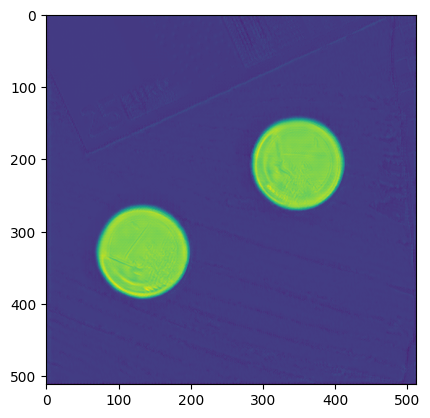

In [9]:
model_simplified_16 = build_unet(channels=[4, 8, 16, 32], bottleneck=64, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_simplified_16.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training Simplified model (Channel/16)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_simplified_16(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_simplified_16.state_dict(), "model_simplified_16.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
    
    torch.cuda.empty_cache()

model_simplified_16.load_state_dict(torch.load("model_simplified_16.pth"))

it = iter(ds_loader)
img, label = next(it)

model_simplified_16.eval()

ret = model_simplified_16(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - 1/16 channel Reduced Model
The segmentation quality is significantly lower. The masks appear blurry, and the model struggles to maintain the correct geometry of the objects.

### 6. Model 1/32: Minimum Capacity
This is the most compressed version (2, 4, 8, 16). This test shows the total breakdown of the network's ability to learn useful spatial features.

Training Simplified model (Channel/32)...
Batch: 0
Epoch [1/200], Loss: 0.6267


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [2/200], Loss: 0.6203
Batch: 0
Epoch [3/200], Loss: 0.6133
Batch: 0
Epoch [4/200], Loss: 0.6064
Batch: 0
Epoch [5/200], Loss: 0.6004
Batch: 0
Epoch [6/200], Loss: 0.5952
Batch: 0
Epoch [7/200], Loss: 0.5903
Batch: 0
Epoch [8/200], Loss: 0.5856
Batch: 0
Epoch [9/200], Loss: 0.5812
Batch: 0
Epoch [10/200], Loss: 0.5769
Batch: 0
Epoch [11/200], Loss: 0.5729
Batch: 0
Epoch [12/200], Loss: 0.5691
Batch: 0
Epoch [13/200], Loss: 0.5656
Batch: 0
Epoch [14/200], Loss: 0.5623
Batch: 0
Epoch [15/200], Loss: 0.5591
Batch: 0
Epoch [16/200], Loss: 0.5560
Batch: 0
Epoch [17/200], Loss: 0.5530
Batch: 0
Epoch [18/200], Loss: 0.5501
Batch: 0
Epoch [19/200], Loss: 0.5473
Batch: 0
Epoch [20/200], Loss: 0.5445
Batch: 0
Epoch [21/200], Loss: 0.5418
Batch: 0
Epoch [22/200], Loss: 0.5391
Batch: 0
Epoch [23/200], Loss: 0.5365
Batch: 0
Epoch [24/200], Loss: 0.5339
Batch: 0
Epoch [25/200], Loss: 0.5314
Batch: 0
Epoch [26/200], Loss: 0.5289
Batch: 0
Epoch [27/200], Loss: 0.5265
Batch: 0
Epoch [28/2

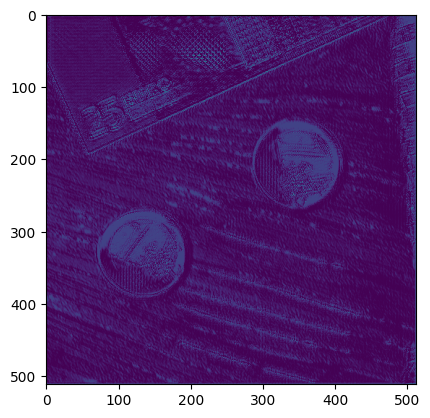

In [10]:
model_simplified_32 = build_unet(channels=[2, 4, 8, 16], bottleneck=32, skips=[True, True, True, True]).to(device)
optimizer = optim.Adam(model_simplified_32.parameters(), lr=1e-4)
criterion = nn.MSELoss()

print("Training Simplified model (Channel/32)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_simplified_32(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_simplified_32.state_dict(), "model_simplified_32.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
        
    torch.cuda.empty_cache()

model_simplified_32.load_state_dict(torch.load("model_simplified_32.pth"))

it = iter(ds_loader)
img, label = next(it)

model_simplified_32.eval()

ret = model_simplified_32(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - 1/32 channel Reduced Model
The model fails to produce usable segmentation. The output consists of generic blobs, proving that this capacity is insufficient for the task.

# Ablation Study: Removing Skip Connections
Finally, we train versions of the model where skip connections are progressively removed. This helps us understand how crucial these connections are for recovering fine details during the upsampling process.

### 7. Model No Skip 1: Removing the Deepest Connection
Returning to the baseline channel count, we disable the skip connection at the lowest level (Level 4). This level carries the most abstract information.

Training No-Skip model (No skip in last decoder)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_26588\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.3192
Batch: 0
Epoch [2/200], Loss: 0.6201
Batch: 0
Epoch [3/200], Loss: 0.2352
Batch: 0
Epoch [4/200], Loss: 0.1441
Batch: 0
Epoch [5/200], Loss: 0.1032
Batch: 0
Epoch [6/200], Loss: 0.0694
Batch: 0
Epoch [7/200], Loss: 0.0539
Batch: 0
Epoch [8/200], Loss: 0.0408
Batch: 0
Epoch [9/200], Loss: 0.0314
Batch: 0
Epoch [10/200], Loss: 0.0231
Batch: 0
Epoch [11/200], Loss: 0.0187
Batch: 0
Epoch [12/200], Loss: 0.0165
Batch: 0
Epoch [13/200], Loss: 0.0147
Batch: 0
Epoch [14/200], Loss: 0.0126
Batch: 0
Epoch [15/200], Loss: 0.0116
Batch: 0
Epoch [16/200], Loss: 0.0100
Batch: 0
Epoch [17/200], Loss: 0.0092
Batch: 0
Epoch [18/200], Loss: 0.0081
Batch: 0
Epoch [19/200], Loss: 0.0069
Batch: 0
Epoch [20/200], Loss: 0.0063
Batch: 0
Epoch [21/200], Loss: 0.0054
Batch: 0
Epoch [22/200], Loss: 0.0044
Batch: 0
Epoch [23/200], Loss: 0.0041
Batch: 0
Epoch [24/200], Loss: 0.0041
Batch: 0
Epoch [25/200], Loss: 0.0041
Batch: 0
Epoch [26/200], Loss: 0.0040
Batch: 0
Epoch [27/20

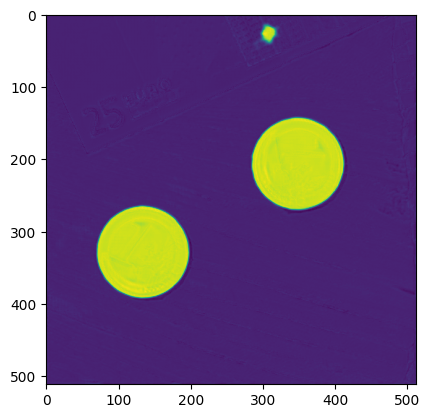

In [11]:
model_no_skip_1 = build_unet(channels=[64, 128, 256, 512], bottleneck=1024, skips=[False, True, True, True]).to(device)
optimizer = optim.Adam(model_no_skip_1.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training No-Skip model (No skip in last decoder)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_no_skip_1(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_no_skip_1.state_dict(), "model_no_skip_1.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    torch.cuda.empty_cache()
        
model_no_skip_1.load_state_dict(torch.load("model_no_skip_1.pth"))

it = iter(ds_loader)
img, label = next(it)

model_no_skip_1.eval()

ret = model_no_skip_1(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - No Skip 1 Model
The impact is minimal. Because this level is closest to the bottleneck, the expansive path can still recover most information through the upsampling process.

### 8. Model No Skip 2: Removing Two Deepest Connections
We disable skip connections at Level 4 and Level 3. The decoder must now reconstruct intermediate spatial data without direct help from the encoder.

Training No-Skip model (No skip in last two decoders)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_18252\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_18252\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.2612
Batch: 0
Epoch [2/200], Loss: 0.4081
Batch: 0
Epoch [3/200], Loss: 0.1906
Batch: 0
Epoch [4/200], Loss: 0.1287
Batch: 0
Epoch [5/200], Loss: 0.0887
Batch: 0
Epoch [6/200], Loss: 0.0547
Batch: 0
Epoch [7/200], Loss: 0.0417
Batch: 0
Epoch [8/200], Loss: 0.0346
Batch: 0
Epoch [9/200], Loss: 0.0283
Batch: 0
Epoch [10/200], Loss: 0.0261
Batch: 0
Epoch [11/200], Loss: 0.0235
Batch: 0
Epoch [12/200], Loss: 0.0229
Batch: 0
Epoch [13/200], Loss: 0.0209
Batch: 0
Epoch [14/200], Loss: 0.0193
Batch: 0
Epoch [15/200], Loss: 0.0182
Batch: 0
Epoch [16/200], Loss: 0.0165
Batch: 0
Epoch [17/200], Loss: 0.0152
Batch: 0
Epoch [18/200], Loss: 0.0138
Batch: 0
Epoch [19/200], Loss: 0.0123
Batch: 0
Epoch [20/200], Loss: 0.0115
Batch: 0
Epoch [21/200], Loss: 0.0109
Batch: 0
Epoch [22/200], Loss: 0.0100
Batch: 0
Epoch [23/200], Loss: 0.0092
Batch: 0
Epoch [24/200], Loss: 0.0086
Batch: 0
Epoch [25/200], Loss: 0.0081
Batch: 0
Epoch [26/200], Loss: 0.0076
Batch: 0
Epoch [27/20

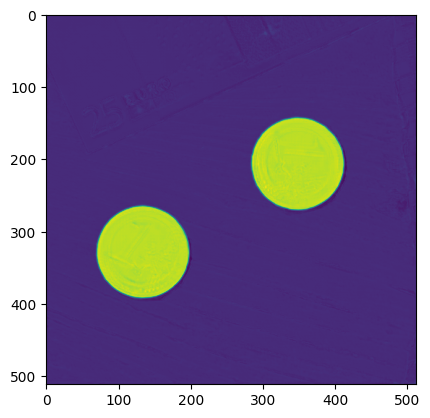

In [5]:
model_no_skip_2 = build_unet(channels=[64, 128, 256, 512], bottleneck=1024, skips=[False, False, True, True]).to(device)
optimizer = optim.Adam(model_no_skip_2.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training No-Skip model (No skip in last two decoders)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_no_skip_2(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_no_skip_2.state_dict(), "model_no_skip_2.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break
    
    torch.cuda.empty_cache()

model_no_skip_2.load_state_dict(torch.load("model_no_skip_2.pth"))

it = iter(ds_loader)
img, label = next(it)

model_no_skip_2.eval()

ret = model_no_skip_2(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

### Conclusions - No Skip 2 Model
The difference in performance remains almost imperceptible. The removal of these deeper skip connections has a very limited impact on the final mask, suggesting that the most critical spatial information is concentrated in the shallower layers of the network.

### 9. Model No Skip 3: Removing Three Connections
Only the shallowest skip connection (Level 1) remains active. This model relies almost entirely on the bottleneck features to generate the mask.

Training No-Skip model (No skip in last three decoders)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_29584\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_29584\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.3279
Batch: 0
Epoch [2/200], Loss: 0.5004
Batch: 0
Epoch [3/200], Loss: 0.1648
Batch: 0
Epoch [4/200], Loss: 0.0995
Batch: 0
Epoch [5/200], Loss: 0.0890
Batch: 0
Epoch [6/200], Loss: 0.0573
Batch: 0
Epoch [7/200], Loss: 0.0509
Batch: 0
Epoch [8/200], Loss: 0.0417
Batch: 0
Epoch [9/200], Loss: 0.0314
Batch: 0
Epoch [10/200], Loss: 0.0267
Batch: 0
Epoch [11/200], Loss: 0.0230
Batch: 0
Epoch [12/200], Loss: 0.0176
Batch: 0
Epoch [13/200], Loss: 0.0146
Batch: 0
Epoch [14/200], Loss: 0.0130
Batch: 0
Epoch [15/200], Loss: 0.0122
Batch: 0
Epoch [16/200], Loss: 0.0111
Batch: 0
Epoch [17/200], Loss: 0.0099
Batch: 0
Epoch [18/200], Loss: 0.0095
Batch: 0
Epoch [19/200], Loss: 0.0086
Batch: 0
Epoch [20/200], Loss: 0.0079
Batch: 0
Epoch [21/200], Loss: 0.0070
Batch: 0
Epoch [22/200], Loss: 0.0066
Batch: 0
Epoch [23/200], Loss: 0.0062
Batch: 0
Epoch [24/200], Loss: 0.0059
Batch: 0
Epoch [25/200], Loss: 0.0057
Batch: 0
Epoch [26/200], Loss: 0.0054
Batch: 0
Epoch [27/20

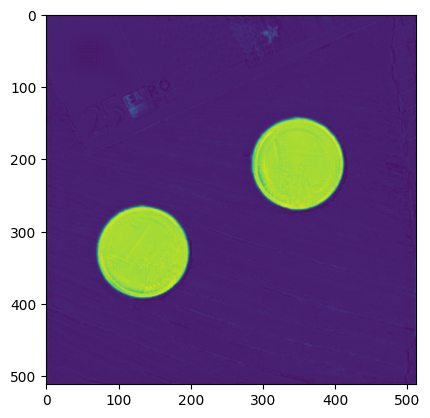

In [5]:
model_no_skip_3 = build_unet(channels=[64, 128, 256, 512], bottleneck=1024, skips=[False, False, False, True]).to(device)
optimizer = optim.Adam(model_no_skip_3.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training No-Skip model (No skip in last three decoders)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_no_skip_3(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_no_skip_3.state_dict(), "model_no_skip_3.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    torch.cuda.empty_cache()

model_no_skip_3.load_state_dict(torch.load("model_no_skip_3.pth"))

it = iter(ds_loader)
img, label = next(it)

model_no_skip_3.eval()

ret = model_no_skip_3(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

#### Conclusions - No Skip 3 Model
Surprisingly, the results still do not show a significant degradation. The segmentation remains very similar to the baseline, which indicates that the first skip connection is the most critical one for maintaining the spatial integrity of the masks in this specific dataset.

### 10. Model No Skip 4: Pure Encoder-Decoder
In this final experiment, we remove every single skip connection, transforming the U-Net into a standard Encoder-Decoder architecture. All information must now pass through the bottleneck to reconstruct the output mask.

Training No-Skip model (No skip in all decoders)...


C:\Users\fabio\AppData\Local\Temp\ipykernel_23724\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_23724\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


Batch: 0
Epoch [1/200], Loss: 0.3010
Batch: 0
Epoch [2/200], Loss: 0.5953
Batch: 0
Epoch [3/200], Loss: 0.1985
Batch: 0
Epoch [4/200], Loss: 0.1637
Batch: 0
Epoch [5/200], Loss: 0.1368
Batch: 0
Epoch [6/200], Loss: 0.1253
Batch: 0
Epoch [7/200], Loss: 0.1248
Batch: 0
Epoch [8/200], Loss: 0.1252
Batch: 0
Epoch [9/200], Loss: 0.1232
Batch: 0
Epoch [10/200], Loss: 0.1203
Batch: 0
Epoch [11/200], Loss: 0.1181
Batch: 0
Epoch [12/200], Loss: 0.1173
Batch: 0
Epoch [13/200], Loss: 0.1170
Batch: 0
Epoch [14/200], Loss: 0.1157
Batch: 0
Epoch [15/200], Loss: 0.1135
Batch: 0
Epoch [16/200], Loss: 0.1105
Batch: 0
Epoch [17/200], Loss: 0.1065
Batch: 0
Epoch [18/200], Loss: 0.1006
Batch: 0
Epoch [19/200], Loss: 0.0926
Batch: 0
Epoch [20/200], Loss: 0.0835
Batch: 0
Epoch [21/200], Loss: 0.0745
Batch: 0
Epoch [22/200], Loss: 0.0718
Batch: 0
Epoch [23/200], Loss: 0.0690
Batch: 0
Epoch [24/200], Loss: 0.0582
Batch: 0
Epoch [25/200], Loss: 0.0438
Batch: 0
Epoch [26/200], Loss: 0.0290
Batch: 0
Epoch [27/20

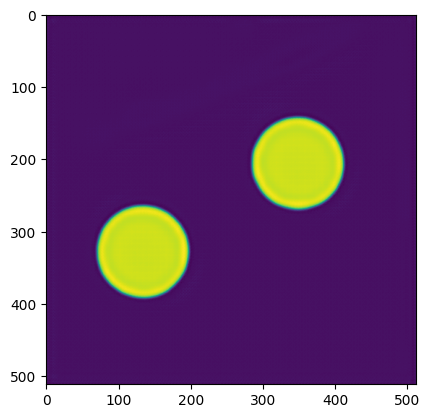

In [5]:
model_no_skip_4 = build_unet(channels=[64, 128, 256, 512], bottleneck=1024, skips=[False, False, False, False]).to(device)
optimizer = optim.Adam(model_no_skip_4.parameters(), lr=1e-3, weight_decay=1e-5)
criterion = nn.MSELoss()

print("Training No-Skip model (No skip in all decoders)...")
epochs = 200
best_loss = float('inf')
patience = 15
patience_counter = 0

for epoch in range(epochs):
    epoch_loss = 0.0
    num_batches = 0
    
    for idx, (img, mask) in enumerate(ds_loader):
        img, mask = img.to(device), mask.to(device)
        
        output = model_no_skip_4(img)
        loss = criterion(output, mask)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        epoch_loss += loss.item()
        num_batches += 1
        print("Batch:", idx)
    
    avg_loss = epoch_loss / num_batches
    print(f'Epoch [{epoch+1}/{epochs}], Loss: {avg_loss:.4f}')
    
    if avg_loss < best_loss:
        best_loss = avg_loss
        patience_counter = 0
        torch.save(model_no_skip_4.state_dict(), "model_no_skip_4.pth")
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print(f"Early stopping at epoch {epoch+1}")
            break

    torch.cuda.empty_cache()

model_no_skip_4.load_state_dict(torch.load("model_no_skip_4.pth"))

it = iter(ds_loader)
img, label = next(it)

model_no_skip_4.eval()

ret = model_no_skip_4(img.to(device))
plt.imshow(ret[1][0].detach().cpu().numpy())

### Conclusions - No Skip 4 Model
Even after removing all skip connections, the model continues to produce results that are very similar to the original baseline. In this specific case, the lack of spatial shortcuts does not cause a significant degradation, indicating that the bottleneck is sufficient to capture and reconstruct the necessary features for this dataset.

# Results Visualization and Comparison
In this final section, we generate plots to compare the original images with the predicted segmentation masks. By visualizing the outputs of our different models (Baseline, Simplified, and No-Skip), we can qualitatively evaluate how the structural changes impact the precision and quality of the segmentations.

C:\Users\fabio\AppData\Local\Temp\ipykernel_29584\2660411871.py:27: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32)
C:\Users\fabio\AppData\Local\Temp\ipykernel_29584\2660411871.py:28: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask = torch.tensor(mask, dtype=torch.float32)


--- Evaluating Model: Original ---


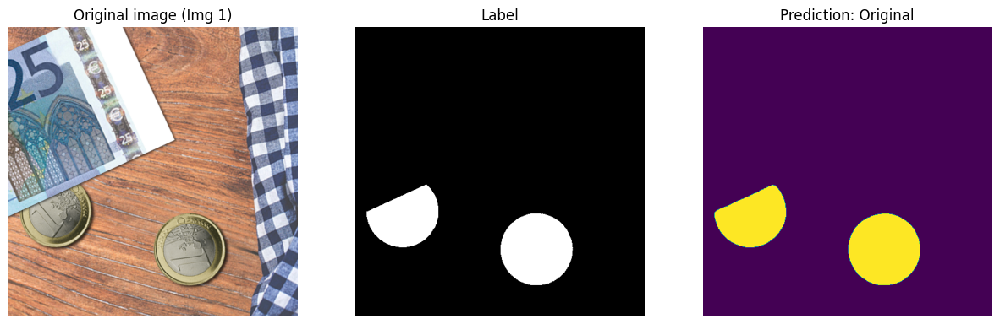

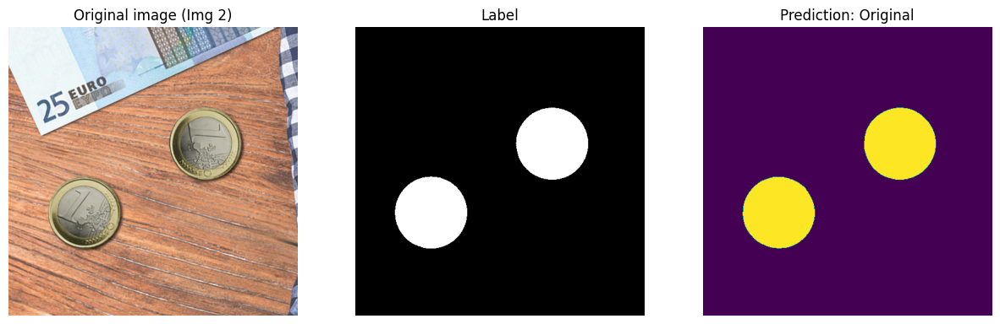

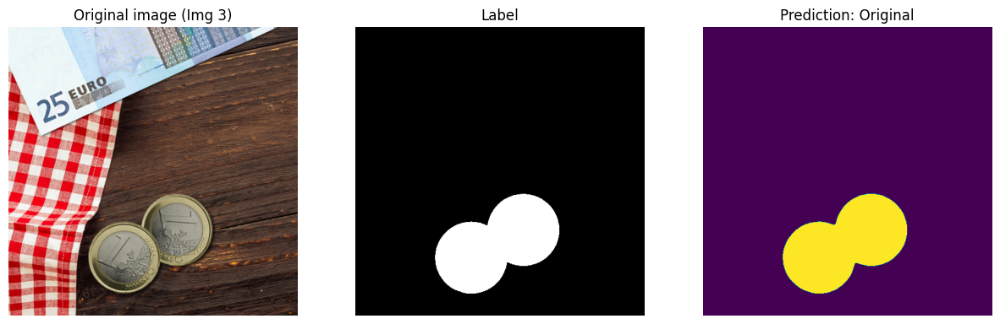

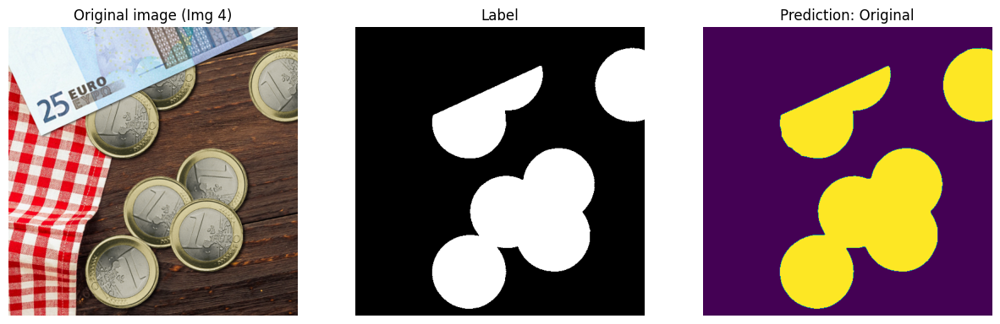

------------------------------------------------------------
--- Evaluating Model: Simp / 2 ---


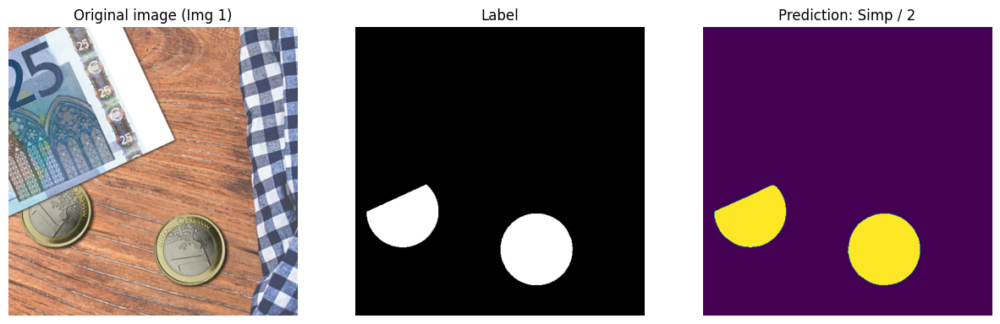

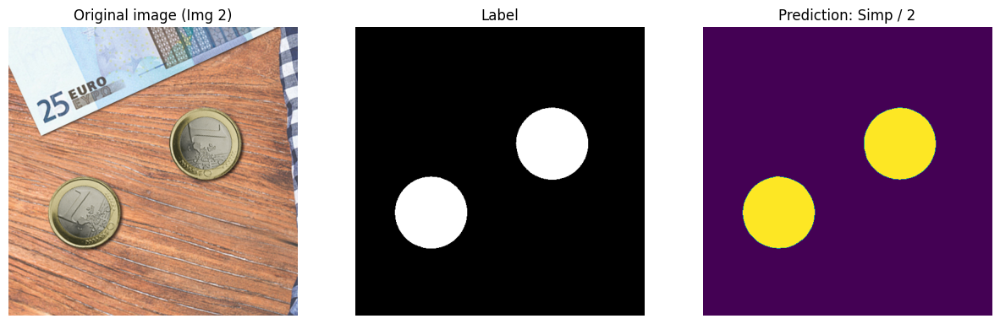

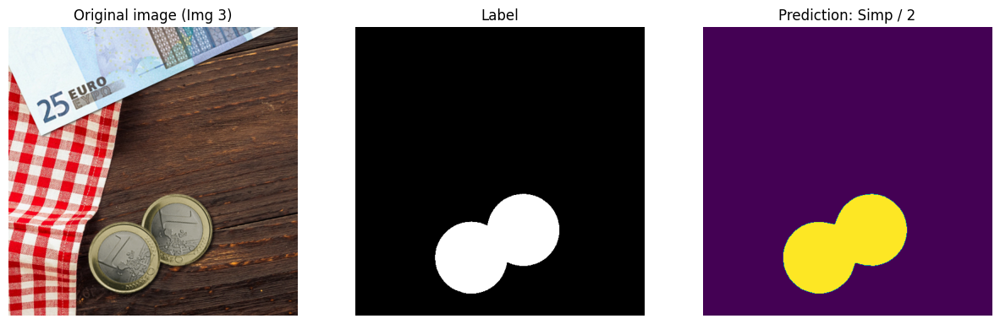

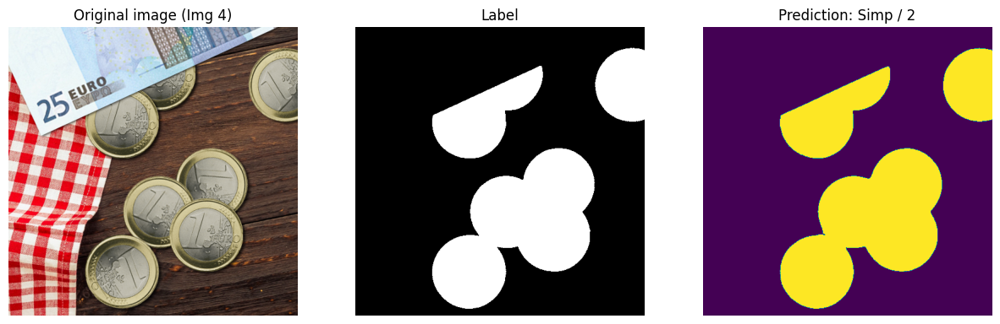

------------------------------------------------------------
--- Evaluating Model: Simp / 4 ---


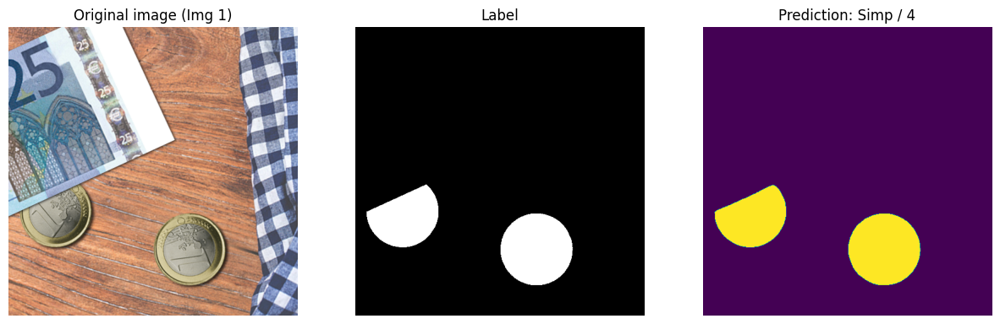

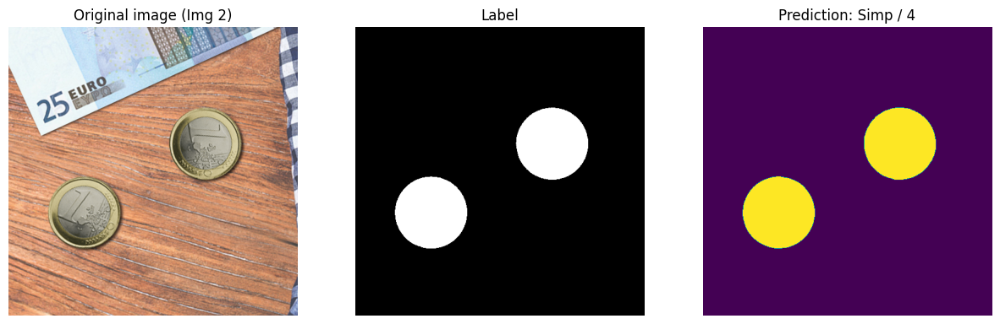

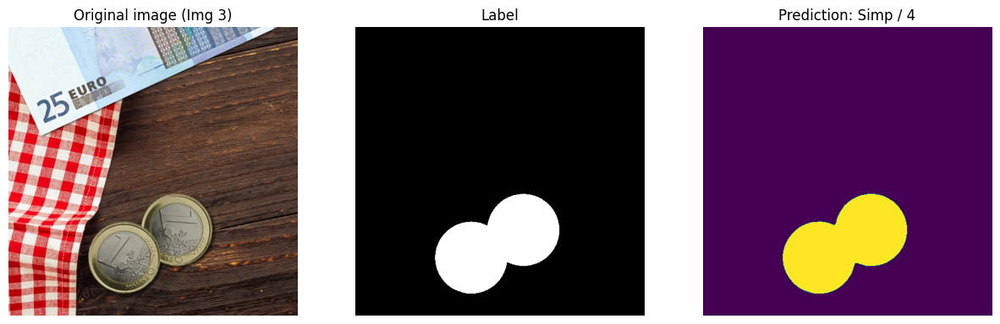

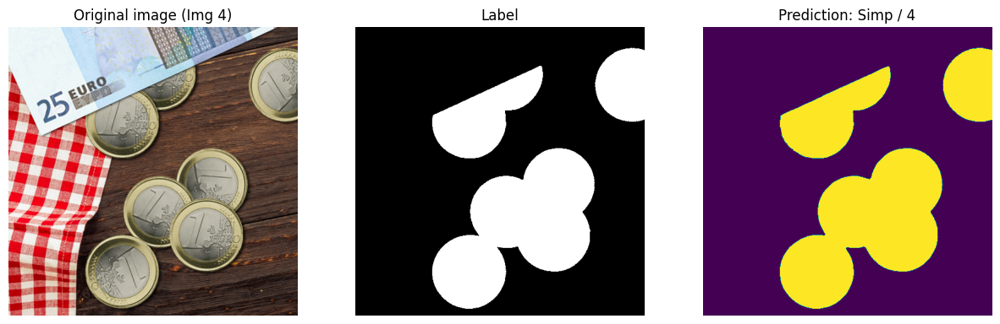

------------------------------------------------------------
--- Evaluating Model: Simp / 8 ---


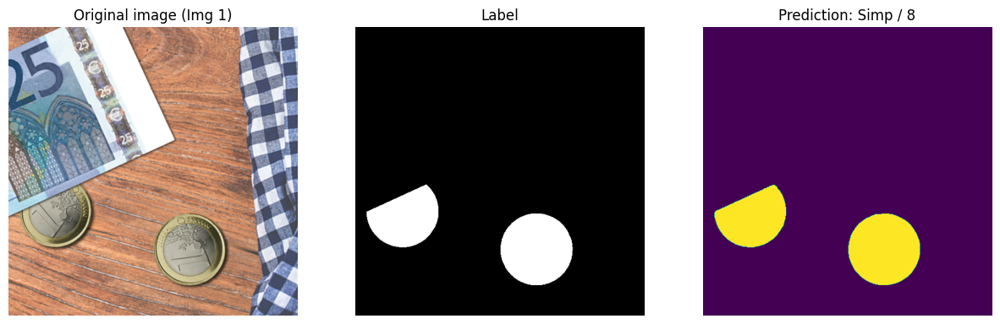

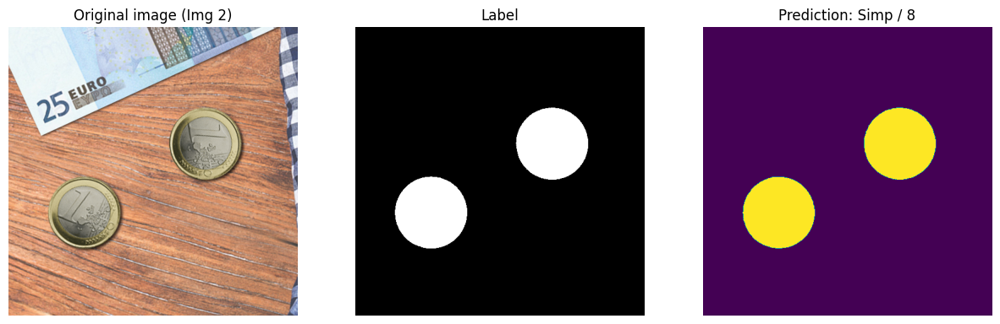

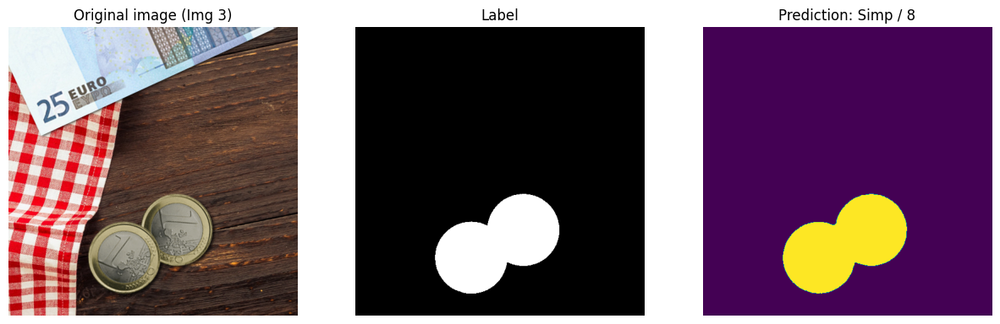

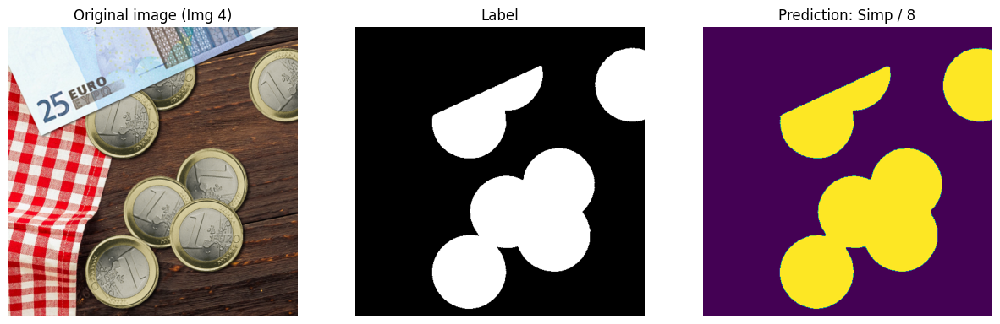

------------------------------------------------------------
--- Evaluating Model: Simp / 16 ---


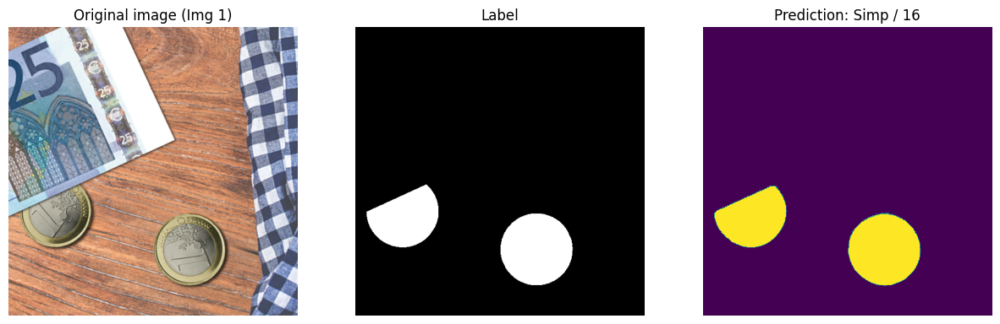

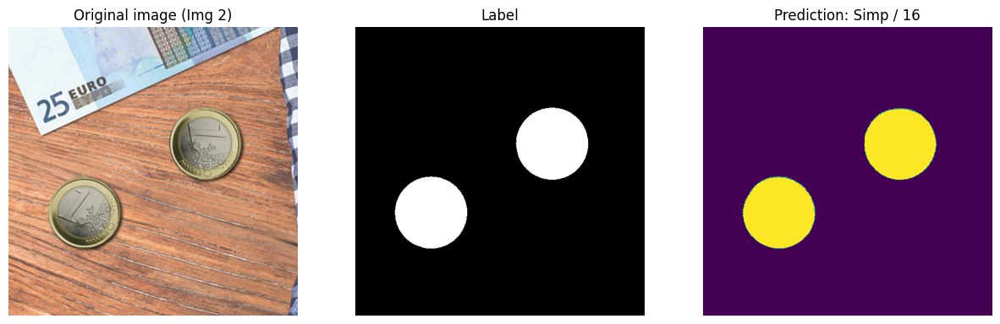

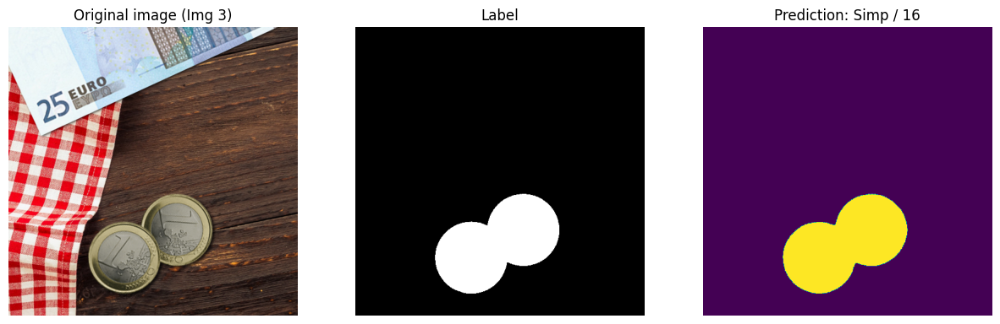

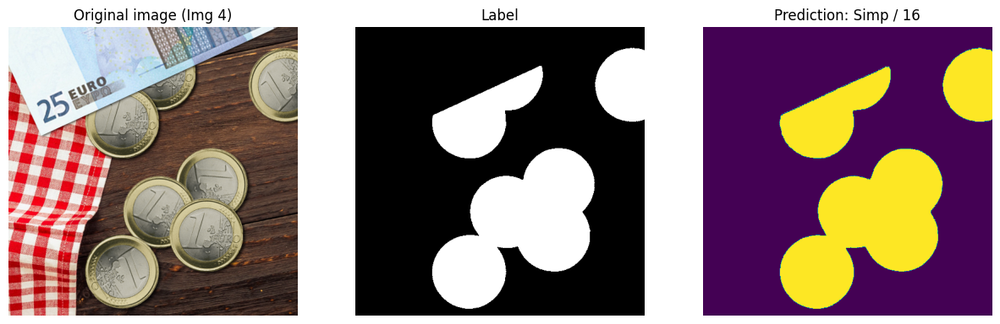

------------------------------------------------------------
--- Evaluating Model: Simp / 32 ---


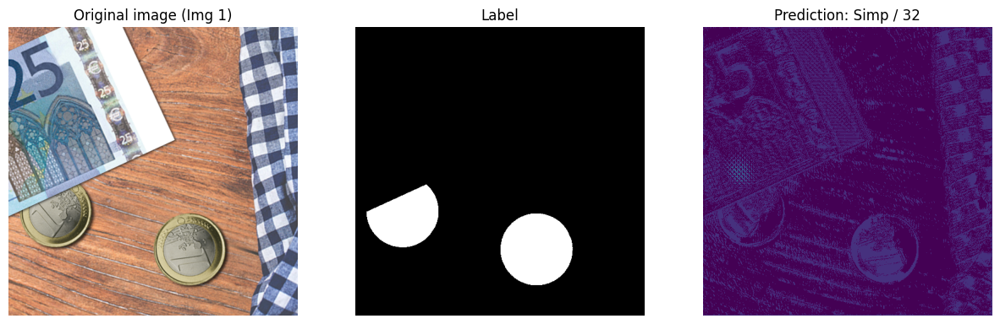

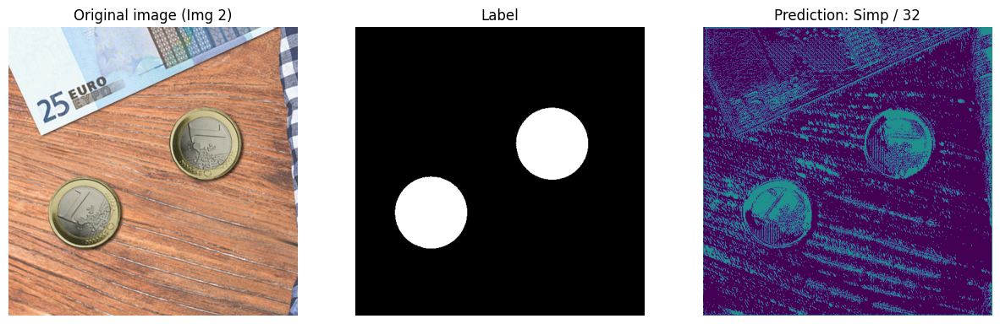

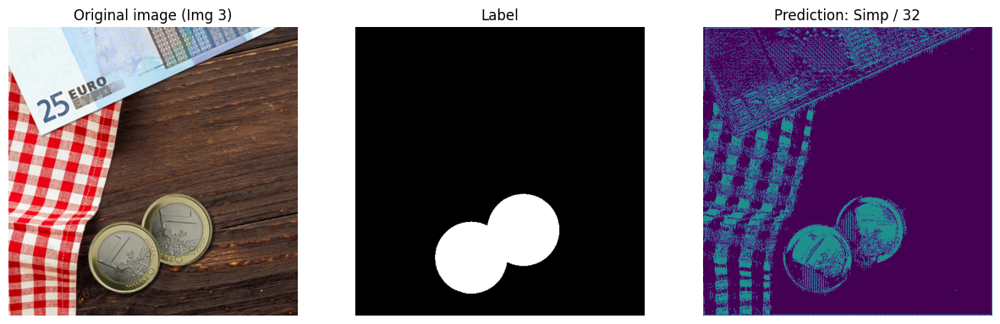

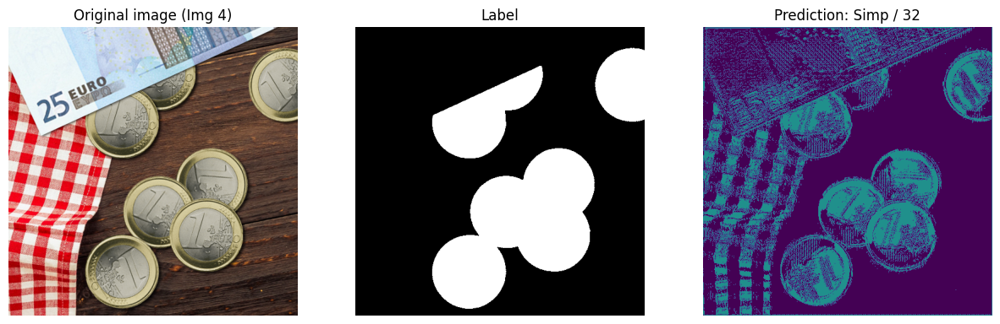

------------------------------------------------------------
--- Evaluating Model: No Skip 1 ---


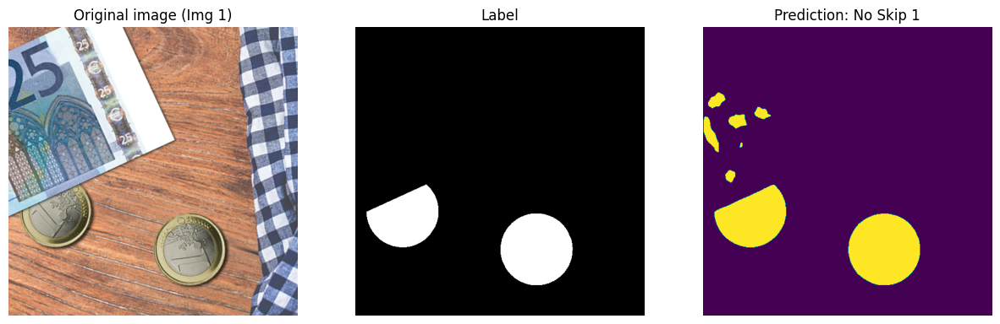

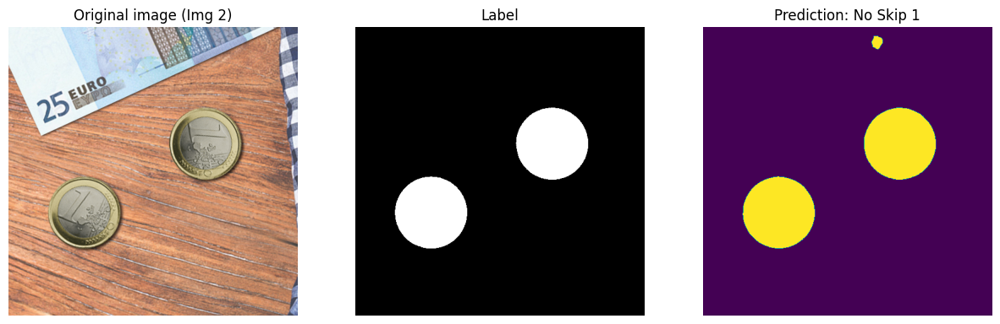

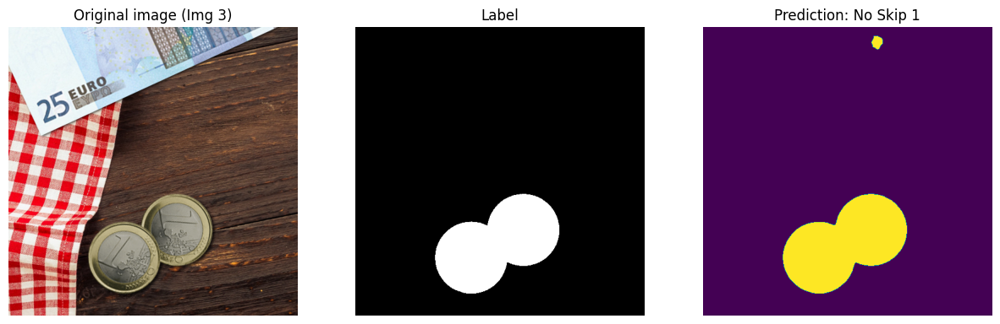

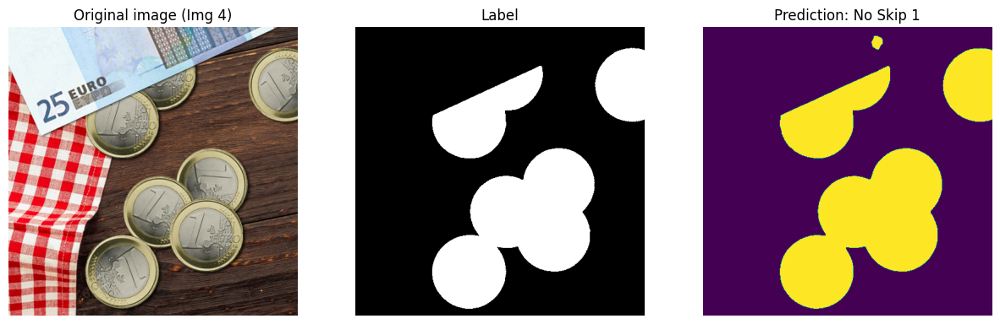

------------------------------------------------------------
--- Evaluating Model: No Skip 2 ---


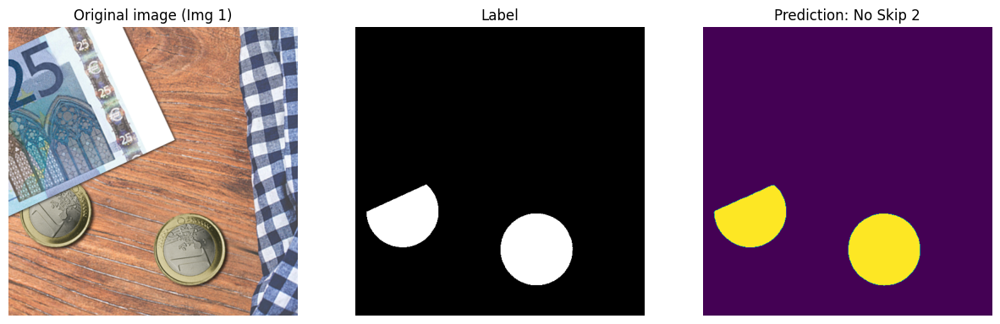

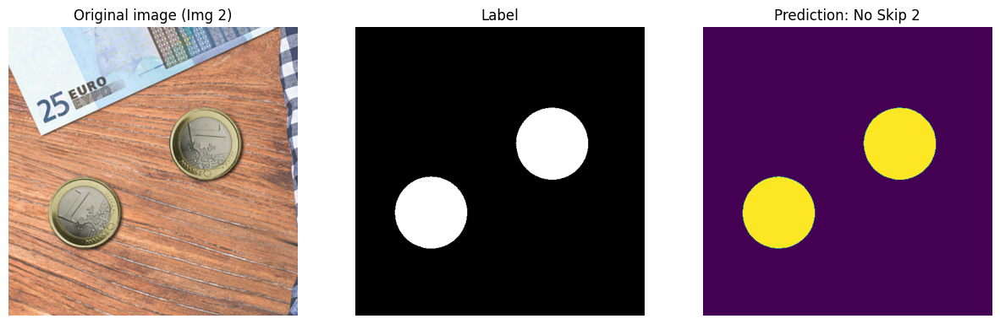

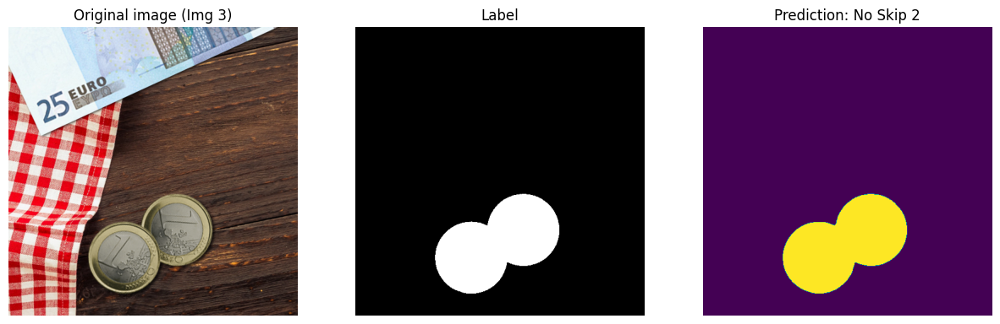

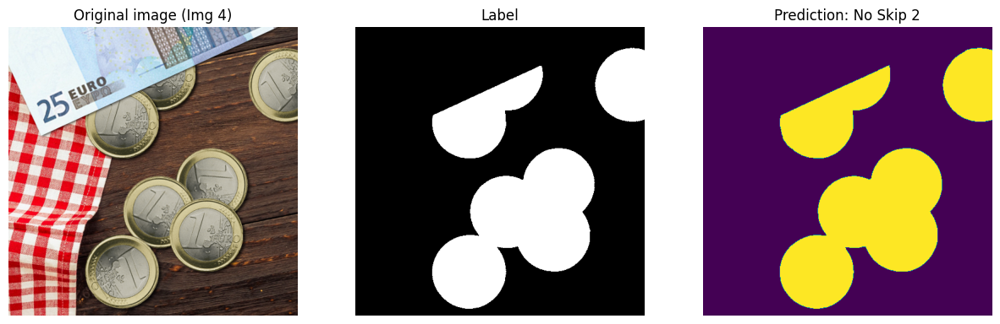

------------------------------------------------------------
--- Evaluating Model: No Skip 3 ---


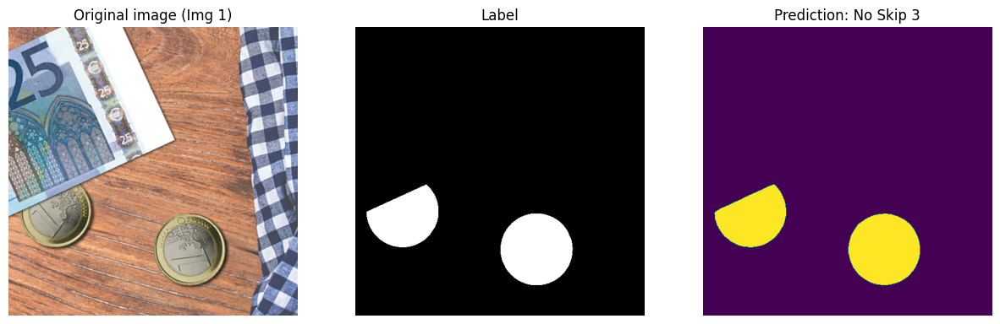

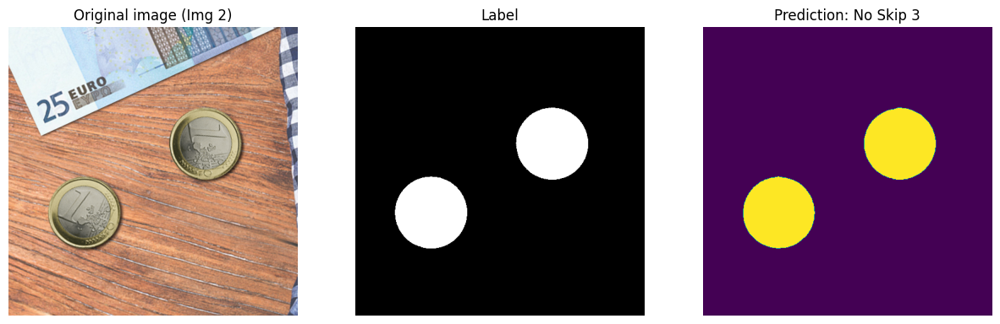

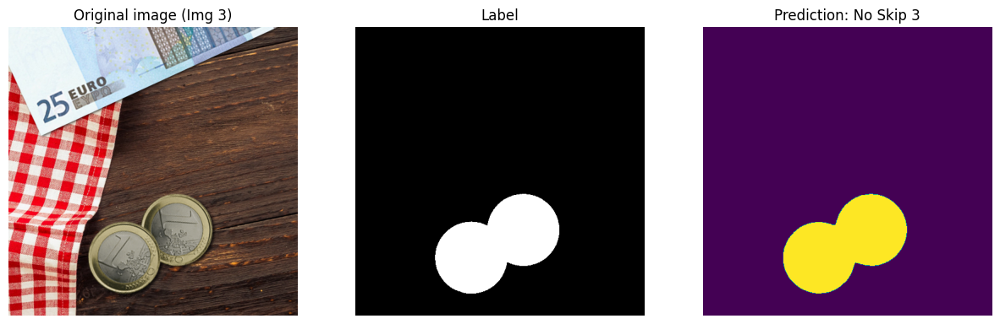

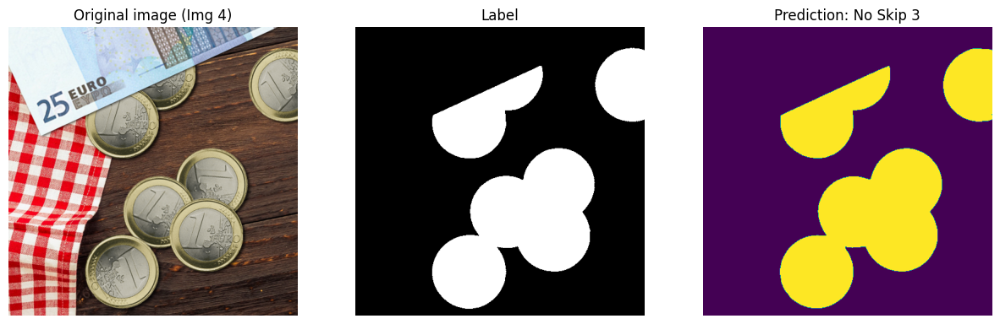

------------------------------------------------------------
--- Evaluating Model: No Skip 4 ---


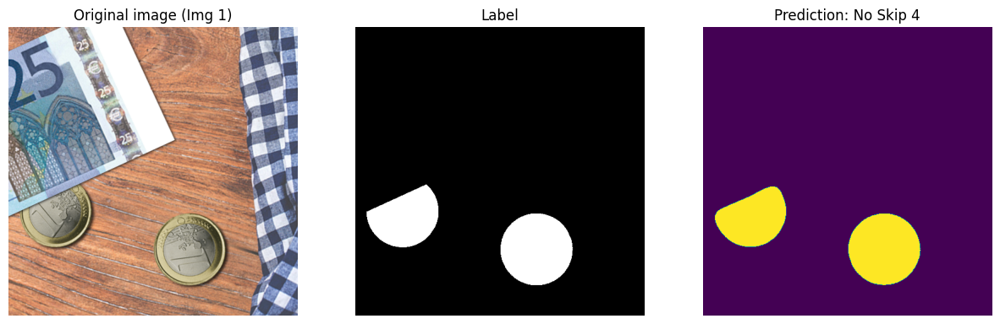

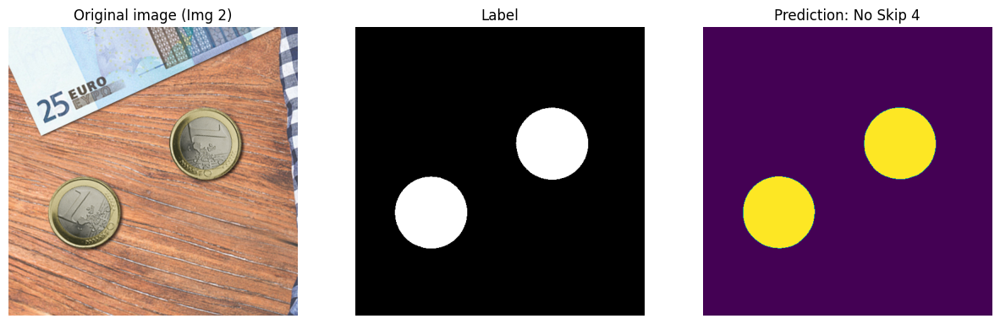

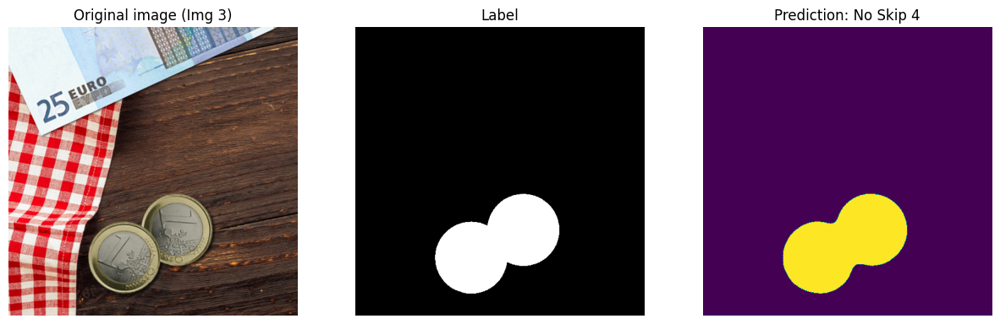

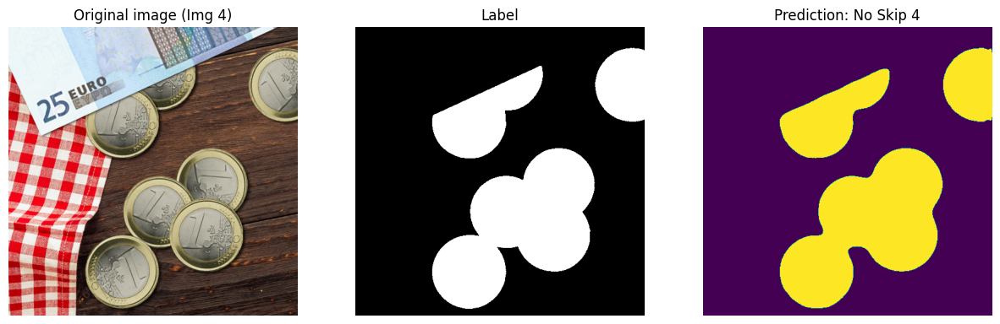

------------------------------------------------------------


In [7]:
it = iter(ds_loader)
img, label = next(it)
img_device = img.to(device)

configs = [
    ("model_original", "Original", [64,128,256,512], 1024, [True,True,True,True]),
    ("model_simplified", "Simp / 2", [32,64,128,256], 512, [True,True,True,True]),
    ("model_simplified_4", "Simp / 4", [16,32,64,128], 256, [True,True,True,True]),
    ("model_simplified_8", "Simp / 8", [8,16,32,64], 128, [True,True,True,True]),
    ("model_simplified_16", "Simp / 16", [4,8,16,32], 64, [True,True,True,True]),
    ("model_simplified_32", "Simp / 32", [2,4,8,16], 32, [True,True,True,True]),
    ("model_no_skip_1", "No Skip 1", [64,128,256,512], 1024, [False,True,True,True]),
    ("model_no_skip_2", "No Skip 2", [64,128,256,512], 1024, [False,False,True,True]),
    ("model_no_skip_3", "No Skip 3", [64,128,256,512], 1024, [False,False,False,True]),
    ("model_no_skip_4", "No Skip 4", [64,128,256,512], 1024, [False,False,False,False]),
]

for file_id, label_name, chans, bn, skips in configs:
    model = build_unet(channels=chans, bottleneck=bn, skips=skips).to(device)
    model.load_state_dict(torch.load(f"{file_id}.pth", map_location=device))
    model.eval()
    
    print(f"--- Evaluating Model: {label_name} ---")
    
    with torch.no_grad():
        for batch_idx, (img, label) in enumerate(ds_loader):
            img_device = img.to(device)
            preds = torch.round(model(img_device))
            
            for i in range(img.shape[0]):
                plt.figure(figsize=(15, 5))
                
                plt.subplot(1, 3, 1)
                plt.imshow(img[i].permute(1, 2, 0).cpu())
                plt.title(f"Original image (Img {i+1})")
                plt.axis('off')
                
                plt.subplot(1, 3, 2)
                plt.imshow(label[i][0].cpu(), cmap='gray')
                plt.title("Label")
                plt.axis('off')
                
                plt.subplot(1, 3, 3)
                plt.imshow(preds[i][0].cpu())
                plt.title(f"Prediction: {label_name}")
                plt.axis('off')
                
                plt.show()
    
    # Limpieza de memoria
    del model
    torch.cuda.empty_cache()
    print("-" * 60)